#Assignment 3
Trabalho realizado por:

Telmo Cunha 2018308321



In [ ]:
# import torch
# torch.cuda.empty_cache()

Install dependencies

In [ ]:
!sudo apt update


!sudo apt install ffmpeg
!pip install moviepy
!ffmpeg -version
!pip install imageio-ffmpeg
!pip install pygame pyvirtualdisplay > /dev/null 2>&1
!apt-get install -y xvfb python-opengl ffmpeg > /dev/null 2>&1
# install required system dependencies
!apt-get install -y xvfb x11-utils

# install required python dependencies (might need to install additional gym extras depending)
#!pip install gym[box2d]==0.17.* pyvirtualdisplay==0.2.* PyOpenGL==3.1.* PyOpenGL-accelerate==3.1.*
!pip install gym[box2d]==0.17.* pyvirtualdisplay==0.2.* PyOpenGL==3.1.* PyOpenGL-accelerate==3.1.*

!git clone https://github.com/openai/gym.git
%cd gym
!pip install -e .
#!pip install stable-baselines[mpi]
#!pip install stable-baselines3[extra]


Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Get:2 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:6 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:8 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Get:12 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [83.3 kB]
Hit:13 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:14 http://ppa.launchpad.ne

In [ ]:
!pip install gym[box2d]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 721 kB 26.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 374 kB 52.8 MB/s 
     |████████████████████████████████| 18.3 MB 8.3 MB/s 
     |████████████████████████████████| 1.8 MB 47.4 MB/s 
  Created wheel for gym: filename=gym-0.26.2-py3-none-any.whl size=827651 sha256=e74c158ffd06115b109af19984f7f3fb74bec36f2f9981759a35ac51bfb9f06e
  Stored in directory: /root/.cache/pip/wheels/17/79/65/7afedc162d858b02708a3b8f7a6dd5b1000dcd5b0f894f7cc1
  ERROR: Failed building wheel for box2d-py
  Running setup.py clean for box2d-py
Successfully built gym
Failed to build box2d-py
  Attempting uninstall: pygame
    Found existing installation: pygame 2.1.2
    Uninstalling pygame-2.1.2:
      Successfully uninstalled pygame-2.1.2
    Runn

Imports

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import time
from matplotlib.pyplot import figure

import gym
import torch 
from torch.utils import data
import torch.nn as nn
import torch.optim as optim
import torch.autograd as autograd
import random
from gym import wrappers
import copy
import gym
#from gym.wrappers import Monitor
from gym.wrappers.record_video import RecordVideo

import glob
import io
import base64
from IPython.display import HTML
from pyvirtualdisplay import Display
from IPython import display as ipythondisplay

display = Display(visible=0, size=(1400, 900))
display.start()
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')



###################################################
###################################################
###################################################
UseRandomize=True;
UseContinuousControl=False;
###################################################
###################################################
###################################################



Deep RL Replay Buffer

In [ ]:
class ReplayBuffer:
    def __init__(self, size):
        self.size = size
        self.counter = 0
        self.state_buffer = []
        self.action_buffer = []
        self.reward_buffer = []
        self.new_state_buffer = []
        self.terminal_buffer = []
        
    def store_tuples(self, state, action, reward, new_state, done):
        if len(self.state_buffer) < self.size:
            self.state_buffer.append(None)
            self.action_buffer.append(None)
            self.reward_buffer.append(None)
            self.new_state_buffer.append(None)
            self.terminal_buffer.append(None)
            
        self.counter = self.counter % self.size
        self.state_buffer[self.counter] = state
        self.action_buffer[self.counter] = action
        self.reward_buffer[self.counter] = reward
        self.new_state_buffer[self.counter] = new_state
        self.terminal_buffer[self.counter] = done
        self.counter += 1

    def sample_buffer(self, batch_size):
        max_buffer = min(self.counter, self.size)
        batch = np.random.choice(max_buffer, batch_size, replace=False)
        state_batch=[];
        action_batch=[];
        reward_batch=[];
        new_state_batch=[];
        done_batch=[];
        
        for a in batch:
            state_batch.append(self.state_buffer[a])
            action_batch.append(self.action_buffer[a])
            reward_batch.append(self.reward_buffer[a])
            new_state_batch.append(self.new_state_buffer[a])
            done_batch.append(self.terminal_buffer[a])
        return state_batch, action_batch, reward_batch, new_state_batch, done_batch





Default DQN arquitecture

In [ ]:
from torchvision import datasets, models
class DQN(nn.Module):

    def __init__(self, inputs, outputs):
        super(DQN, self).__init__()
        
        self.input_size=inputs;
        self.output_size=outputs;

        
        self.features = nn.Sequential(
            #TODO Add code here for DQN 
            #you can use the same code for dueling
            nn.Conv2d(in_channels=inputs, out_channels=16, kernel_size=5, stride=1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),
            
            # 2nd Convolutional layer
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=4, stride=1),
            nn.ReLU(),
        
            #3nd convolutional layer
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, stride=1),
            nn.ReLU(),
            nn.MaxPool2d(2,2)
            
        )
        
        self.layers = nn.Sequential( 
            #TODO Add code here 
            nn.Linear(in_features=64*20*20, out_features=512),
            nn.ReLU(),
            nn.Linear(in_features=512 ,out_features=256),
            nn.ReLU(),
            nn.Linear(in_features=256, out_features=outputs)
        ) 


        self.layersdueling = nn.Sequential(
            #TODO Add code 
            nn.Linear(in_features=64*20*20, out_features=512),
            nn.ReLU(),
            nn.Linear(in_features=512 ,out_features=256),
            nn.ReLU(),
            nn.Linear(in_features=256, out_features=128),
  
        )


        self.advantage = nn.Sequential(
            #TODO Add code here 
            nn.Linear(in_features=128, out_features=64),
            nn.Linear(in_features=64, out_features=outputs)
        )
        
        self.value = nn.Sequential(
            #TODO Add code here 
            nn.Linear(in_features=128, out_features=64),
            nn.Linear(in_features=64, out_features=1)
        )
        
###### DQN/Double DQN configuration 
                                                    
###########    ############    #################            
#         #    #          #    #               #    
#   IMG   # -> # features # -> #     layers    #    .... argmax ....
#         #    #  (CONVs) #    #     (FCs)     #  
###########    ############    #################   
   

###### Dueling configuration 
                                                    #############
###########    ############    #################    # advantage #           
#         #    #          #    #               # -> #############   ... value + advantage  - advantage.mean() ... argmax ...    
#   IMG   # -> # features # -> # layersdueling # -> #############
#         #    #  (CONVs) #    #     (FCs)     #    #   value   #
###########    ############    #################    #############
 

    def forward(self, x):
    
        if(useDueling):
            x=self.features(x)
            x = x.view(x.size(0), -1)
            x = self.layersdueling(x)
            advantage = self.advantage(x)
            value     = self.value(x)
            return value + advantage  - advantage.mean()
        else:
            x=self.features(x)
            x = x.view(x.size(0), -1)
            return self.layers(x)

    def policy(self,state):
       with torch.no_grad():
            return self.__call__(state.unsqueeze(0)).argmax()
     
    def getPolicy(self,state,eps_threshold):
        sample = random.random()
        if sample > eps_threshold:
            with torch.no_grad():
                return self.__call__(state.unsqueeze(0)).argmax()
        else:
            return  torch.tensor(random.randrange(self.output_size), device=device, dtype=torch.long)


OpenAI Environment CarRacing-v2

 
###    Description:
        Continuous or discrete control task to learn from pixels, a top-down racing environment.
###    Observation:
        Type: Image (96x96x3)
        Some indicators are shown at the bottom of the window along with the state RGB buffer. From left to right: the true speed, four ABS sensors, the steering wheel position and gyroscope.
###    Actions:
        Discrete Mode: 'nothing','left','right','gas','brake'
        Continuous Mode: 3 different variables can be modified: steering wheel, gas, and brake. For the methods explored in this Colab, discrete control commands are reasonable (a set of control commands is provided for this mode).
###    Reward:
        The reward is -0.1 every frame and +1000/N for every track tile visited, where N is the total number of tiles visited in the track. For example, if you have finished in 732 frames, your reward is 1000 - 0.1*732 = 926.8 points.
###    Starting State:
        The tracks and colors are randomly generated with UseRandomize=True for each episode. With UseRandomize=False, only the tracks are random.
###    Episode Termination:
        Car is too faraway from the track.
        Car accumulated a negative reward after given iterations (see ResetCounter and InitCounter).
        Episode length is greater than 1000.
        All tiles are visited.
###     Solved Requirements:
        The game is solved when the agent consistently gets 900+ points. For this assignment a minimum of 200 points are required. 


DQN movie generation (for visual evaluation in Google Colab)

In [ ]:
def createMovie(Network,Filename,UseRandomizer,UseContinuous):
  
    env1 = gym.make("CarRacing-v2", render_mode="rgb_array",domain_randomize=UseRandomizer, continuous=UseContinuous)
    envX = env1#wrappers.Monitor(env1, './videos/'+Filename,force=True)
    envX = RecordVideo(env1, video_folder='./videos/'+Filename,  episode_trigger = lambda episode_number: True)  

 

 
    new_state, _ = envX.reset(options={"randomize": UseRandomizer})#,seed=6)


    envX.start_video_recorder()
    # ENV BUG, missing last_frame 
    envX.video_recorder.last_frame=new_state;

    
    stackedStateX=[np.rollaxis(new_state, 2, 0).copy() for i in range(FrameStack)];
    state =torch.from_numpy(np.reshape(np.array(stackedStateX),(FrameSize*FrameStack,96,96)) ).float().to(device)


    i=0
    Network.eval()
    resetStatus=0;   

    while True:
        envX.render()
        
        action = Network.policy(state);
        reward=0
        for x in range(ControlSteps):
            new_state, r, done, truncated, _  = envX.step(action_space[action.item()])
            reward+=r
            if(done):
                break
        #if reward<0 and i>InitCounter:
        #    resetStatus=resetStatus+1;
        #else:
        #    resetStatus=0
        
        stackedStateX.pop(0)
        
 
        stackedStateX.append(np.rollaxis(new_state, 2, 0).copy())
        state=torch.from_numpy(np.reshape(np.array(stackedStateX),(FrameSize*FrameStack,96,96))).float().to(device)
        i=i+1;     
        if done or truncated: #or resetStatus>=ResetCounter: 
          break;

    envX.close()
    env1.close();
    Network.train()
    mp4list = glob.glob('./videos/'+Filename+'/*.mp4')
    if len(mp4list) > 0:
        mp4 = mp4list[0]
        video = io.open(mp4, 'r+b').read()
        encoded = base64.b64encode(video)
        ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
                loop controls style="height: 400px;">
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii'))))
    else: 
        print("Could not find video")

Dummy Net with random policy

In [ ]:
class RandomNet(nn.Module):

    def __init__(self,outputs):
        super(RandomNet, self).__init__()        
        self.output_size=outputs;
        
 
    def forward(self, x):
        return  x

    def policy(self,state):
       return  torch.tensor([[random.randrange(self.output_size)]], device=device, dtype=torch.long)
     
    




Parameters

In [ ]:
 


if UseContinuousControl:
    #action space is still discretized however more actions can be selected
    action_space    = [
            (-1, 1, 0.2), (0, 1, 0.2), (1, 1, 0.2), #           Action Space Structure
            (-1, 1,   0), (0, 1,   0), (1, 1,   0), #        (Steering Wheel, Gas, Break)
            (-1, 0, 0.2), (0, 0, 0.2), (1, 0, 0.2), # Range        -1~1       0~1   0~1
            (-1, 0,   0), (0, 0,   0), (1, 0,   0)];


else:
    action_space=[0,1,2,3,4]    #  nothing','left','right','gas','brake'

 
n_actions=len(action_space)
MaxSteps=1000;

#*************************************************************//*****************************************************************
#hyper-parameters
#TODO set these values:
TotalEpisodes=500;
ControlSteps=3; # number of iterations the same action is executed in the environment (>=1) 
FrameStack=3 # number of consecutive frames used to represent the state (>=1)
FreezeCounter=5; # clone the model every X episodes
ResetCounter=30 # maximum number of experiences with bad performance (max=InitCounter+ResetCounter)
InitCounter=30 # minimum number of experiences per episode


BatchSize=64;
exploration_threshold=1
exploration_threshold_min=0.01
exploration_decay=0.985 
discount_factor=0.95 
LearningRate=0.0001
 
SaveAtCounter=50 # save model or video at every X episodes
FrameSize=3; # 3 if RGB 1 if grayscale

BufferSize=15000  # max number of experiences in the buffer (may need to be smaller if CUDA memory errors occur).


# use these flags to enable Double DQN and Duelinng (Dueling DQN or Double Dueling DQN)
usedoubleDQN=True
useDueling=False



Run the new netwwork with random policy

In [ ]:
randomnet=RandomNet(n_actions)
createMovie(randomnet,"random",UseRandomize,UseContinuousControl)

[MoviePy] >>>> Building video /content/gym/videos/random/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/random/rl-video-episode-0.mp4


 50%|█████     | 1/2 [00:00<00:00, 218.52it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/random/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/random/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/random/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:05<00:00, 172.54it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/random/rl-video-episode-0.mp4 



Initialization and Parameters:


In [ ]:
env = gym.make("CarRacing-v2", render_mode="rgb_array",domain_randomize=UseRandomize, continuous=UseContinuousControl)
spec = gym.spec("CarRacing-v2")


#network DQN
policy_net = DQN(FrameSize*FrameStack, n_actions).to(device)
#policy_net.load_state_dict(torch.load("CarRacing_model_929.1999999999865_model.ckpt"))#load of the weigths for pre-training
target_net = DQN(FrameSize*FrameStack, n_actions).to(device)
target_net.load_state_dict(policy_net.state_dict())
target_net.eval()

buffer = ReplayBuffer(BufferSize);   

optimizer = torch.optim.Adam(policy_net.parameters(), lr=LearningRate)

loss=  torch.nn.SmoothL1Loss()


DQN training

In [ ]:
def trainModel(buffer_data):
    if buffer_data.counter < BatchSize:
        return 0.0

    state_batch, action_batch, reward_batch, new_state_batch, done_batch = buffer_data.sample_buffer(BatchSize)
    state_batch = torch.stack(state_batch).to(device)
    action_batch = torch.stack(action_batch).reshape(-1,1).to(device)
    new_state_batch = torch.stack(new_state_batch).to(device)
    reward_batch = torch.stack(reward_batch).reshape(-1,1).to(device)
    done_batch = torch.stack(done_batch).reshape(-1,1).to(device)

 
    if usedoubleDQN:
      q_actual = torch.gather(policy_net(state_batch),1,index=action_batch)
      q_next = policy_net(new_state_batch)
      #print(q_next.shape)
      q_argmax = q_next.argmax(dim=1,keepdim=True)
        #print(q_argmax)

      with torch.no_grad():
        q_max_next = torch.gather(target_net(new_state_batch),1,index=q_argmax)

      q_target = (q_max_next * discount_factor)*(1-done_batch) + reward_batch

      ll=loss(q_actual, q_target)
     
      #TODO Add Double DQN code here
        
      #print("Teste")
    

    else:
      q_actual = torch.gather(policy_net(state_batch),1,index=action_batch)
      with torch.no_grad():
          q_max_next, _ = target_net(new_state_batch).max(dim=1)
          q_max_next=q_max_next.reshape(-1, 1)

      q_target = (q_max_next * discount_factor)*(1-done_batch) + reward_batch
        
      ll=loss(q_actual, q_target)

    optimizer.zero_grad()
    ll.backward()
    torch.nn.utils.clip_grad_norm_(policy_net.parameters(), 1)
    optimizer.step()

    return ll.item();

In [ ]:
loss_val,scores, episodes,events, avg_scores,avg_scores20,exploration = [],[],[], [],[], [], []

bestScore=-99999;
at=0;
bestNet=copy.deepcopy(policy_net);
 
score = 0.0
for f in range(TotalEpisodes):
    done  = False
    
    tloss = 0.0
  
    new_state,_=env.reset(options={"randomize": UseRandomize})#,seed=6)
   
 
    stackedState=[np.rollaxis(new_state, 2, 0).copy() for i in range(FrameStack)];
    state =torch.from_numpy(np.reshape(np.array(stackedState),(FrameSize*FrameStack,96,96)) ).float().to(device)
   
    if f % FreezeCounter == 0:
       print("#######################-> number of episode:"+str(f)+" of "+str(TotalEpisodes))
       target_net.load_state_dict(policy_net.state_dict())

    score = 0.0   
    if f % SaveAtCounter == 0:
      #torch.save(policy_net.state_dict(), "v2CarRacing_"+str(f)+'_model.ckpt')
      print("\nScore of created video, Current score",str(score),"Best score:",bestScore)
      createMovie(policy_net,"CarRacing_"+str(f),UseRandomize,UseContinuousControl)
       
    resetStatus=0;
    i=0    
    
    for F in range(MaxSteps):
        #env.render()
        action = policy_net.getPolicy(state,exploration_threshold)
        reward=0
        for _ in range(ControlSteps):
            new_state, r, done,trunc, info = env.step(action_space[action.item()])
            reward+=r
            i=i+1
            if(done or trunc):
                break
        if reward<0 and i>InitCounter:
            resetStatus=resetStatus+1;
        else:
            resetStatus=0
            
        stackedState.pop(0)
        stackedState.append(np.rollaxis(new_state, 2, 0).copy())
        new_state=torch.from_numpy(np.reshape(np.array(stackedState),(FrameSize*FrameStack,96,96))).float().to(device)
        
        score += reward
        if(F<(MaxSteps-1)):
            buffer.store_tuples(state, action, torch.tensor(reward), new_state, torch.tensor(int(done)))
            
        state = new_state
        trainModel(buffer)


        if(done or trunc or resetStatus>=ResetCounter):
            break        
    exploration_threshold= exploration_threshold*exploration_decay if exploration_threshold > exploration_threshold_min else exploration_threshold_min

    if(score>bestScore):
        print("Best EP score: ",score," It: ",F*ControlSteps)
        bestScore=score;
        bestNet=copy.deepcopy(policy_net);
        at=f;
    
    exploration.append(exploration_threshold)
    scores.append(score)
    episodes.append(f)
    events.append(F)
    avg_scores.append(score/F)
    avg_scores20.append(np.mean(scores[-20:]))


torch.save(bestNet.state_dict(), "BestCarRacing_"+str(f)+'_'+str(bestScore)+'_model.ckpt')
#Save of the weigths of the model
#torch.save(policy_net.state_dict(),"CarRacing_model_"+str(bestScore)+'_model.pth')
#torch.save(policy_net.state_dict(),"CarRacing_model_"+str(1)+'_model.ckpt')


#######################-> number of episode:0 of 500

Current score 0.0 Best score: -99999

Score of created video, Current score 0.0 Best score: -99999
[MoviePy] >>>> Building video /content/gym/videos/CarRacing_0/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/CarRacing_0/rl-video-episode-0.mp4


 50%|█████     | 1/2 [00:00<00:00, 242.08it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_0/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/CarRacing_0/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/CarRacing_0/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:08<00:00, 114.80it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_0/rl-video-episode-0.mp4 



Best EP score:  -29.584615384616065  It:  939
Best EP score:  -8.932919254658325  It:  459
Best EP score:  3.9526315789474284  It:  168
#######################-> number of episode:5 of 500

Current score -2.711510791366882 Best score: 3.9526315789474284
Best EP score:  9.433962264151253  It:  999
#######################-> number of episode:10 of 500

Current score -2.555172413793089 Best score: 9.433962264151253
Best EP score:  16.49343065693383  It:  489
#######################-> number of episode:15 of 500

Current score 2.3449826989621267 Best score: 16.49343065693383
Best EP score:  69.57878787878863  It:  930
#######################-> number of episode:20 of 500

Current score 3.22280701754401 Best score: 69.57878787878863
#######################-> number of episode:25 of 500

Current score 5.769863013698778 Best score: 69.57878787878863
Best EP score:  82.41038062283802  It:  903
#######################-> number of episode:30 of 500

Current score 20.85245901639292 Best score: 82

 50%|█████     | 1/2 [00:00<00:00, 824.84it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_50/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/CarRacing_50/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/CarRacing_50/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:08<00:00, 113.60it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_50/rl-video-episode-0.mp4 



#######################-> number of episode:55 of 500

Current score 138.9078498293541 Best score: 194.57364341085523
Best EP score:  210.00000000000375  It:  999
#######################-> number of episode:60 of 500

Current score 50.30573476702459 Best score: 210.00000000000375
Best EP score:  262.9343629343662  It:  999
#######################-> number of episode:65 of 500

Current score 179.86348122867216 Best score: 262.9343629343662
#######################-> number of episode:70 of 500

Current score 258.8850174216028 Best score: 262.9343629343662
Best EP score:  275.0000000000011  It:  999
Best EP score:  332.9501915708781  It:  999
#######################-> number of episode:75 of 500

Current score 44.884386617099935 Best score: 332.9501915708781
Best EP score:  387.45519713261496  It:  999
#######################-> number of episode:80 of 500

Current score 215.5893536121702 Best score: 387.45519713261496
Best EP score:  389.7260273972547  It:  999
Best EP score:  396.3503649

 50%|█████     | 1/2 [00:00<00:00, 739.21it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_100/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/CarRacing_100/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/CarRacing_100/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:09<00:00, 106.57it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_100/rl-video-episode-0.mp4 



Best EP score:  560.6498194945733  It:  999
#######################-> number of episode:105 of 500

Current score 328.57142857142577 Best score: 560.6498194945733
Best EP score:  612.2807017543763  It:  999
#######################-> number of episode:110 of 500

Current score 377.19298245613516 Best score: 612.2807017543763
Best EP score:  684.3137254901826  It:  999
#######################-> number of episode:115 of 500

Current score 455.555555555547 Best score: 684.3137254901826
#######################-> number of episode:120 of 500

Current score 585.8108108107992 Best score: 684.3137254901826
Best EP score:  805.882352941161  It:  999
#######################-> number of episode:125 of 500

Current score 127.39442508710883 Best score: 805.882352941161
#######################-> number of episode:130 of 500

Current score 504.2944785276039 Best score: 805.882352941161
#######################-> number of episode:135 of 500

Current score 317.39784172661547 Best score: 805.882352941161

 50%|█████     | 1/2 [00:00<00:00, 510.13it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_150/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/CarRacing_150/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/CarRacing_150/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:10<00:00, 98.22it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_150/rl-video-episode-0.mp4 



#######################-> number of episode:155 of 500

Current score 728.5714285714135 Best score: 870.2602230483122
#######################-> number of episode:160 of 500

Current score 600.6810218977989 Best score: 870.2602230483122
#######################-> number of episode:165 of 500

Current score 108.04210526315872 Best score: 870.2602230483122
#######################-> number of episode:170 of 500

Current score 846.9964664310814 Best score: 870.2602230483122
Best EP score:  884.3749999999866  It:  999
#######################-> number of episode:175 of 500

Current score 812.2807017543707 Best score: 884.3749999999866
Best EP score:  900.7999999999894  It:  990
#######################-> number of episode:180 of 500

Current score 749.8498498498357 Best score: 900.7999999999894
#######################-> number of episode:185 of 500

Current score 785.1851851851712 Best score: 900.7999999999894
#######################-> number of episode:190 of 500

Current score 875.42924187724

 50%|█████     | 1/2 [00:00<00:00, 487.48it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_200/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/CarRacing_200/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/CarRacing_200/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:09<00:00, 100.41it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_200/rl-video-episode-0.mp4 



#######################-> number of episode:205 of 500

Current score 910.2999999999896 Best score: 913.9999999999933
#######################-> number of episode:210 of 500

Current score 773.8461538461438 Best score: 913.9999999999933
#######################-> number of episode:215 of 500

Current score 862.5850340135956 Best score: 913.9999999999933
#######################-> number of episode:220 of 500

Current score 794.0809968847169 Best score: 913.9999999999933
#######################-> number of episode:225 of 500

Current score 281.31712538226185 Best score: 913.9999999999933
#######################-> number of episode:230 of 500

Current score 631.4814814814679 Best score: 913.9999999999933
#######################-> number of episode:235 of 500

Current score 901.544295301996 Best score: 913.9999999999933
Best EP score:  915.8999999999835  It:  840
#######################-> number of episode:240 of 500

Current score 915.8999999999835 Best score: 915.8999999999835
Best EP scor

 50%|█████     | 1/2 [00:00<00:00, 613.83it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_250/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/CarRacing_250/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/CarRacing_250/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:09<00:00, 101.55it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_250/rl-video-episode-0.mp4 



#######################-> number of episode:255 of 500

Current score 889.2398523985147 Best score: 925.2999999999944
#######################-> number of episode:260 of 500

Current score 918.0999999999918 Best score: 925.2999999999944
#######################-> number of episode:265 of 500

Current score 318.14704049843846 Best score: 925.2999999999944
#######################-> number of episode:270 of 500

Current score 793.0817610062702 Best score: 925.2999999999944
#######################-> number of episode:275 of 500

Current score 881.2891156462504 Best score: 925.2999999999944
#######################-> number of episode:280 of 500

Current score 692.9463601532482 Best score: 925.2999999999944
#######################-> number of episode:285 of 500

Current score 767.3983388704237 Best score: 925.2999999999944
#######################-> number of episode:290 of 500

Current score 554.4627062706203 Best score: 925.2999999999944
#######################-> number of episode:295 of 500


 50%|█████     | 1/2 [00:00<00:00, 562.47it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_300/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/CarRacing_300/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/CarRacing_300/rl-video-episode-0.mp4


100%|██████████| 961/961 [00:10<00:00, 93.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_300/rl-video-episode-0.mp4 



#######################-> number of episode:305 of 500

Current score 568.5559485530463 Best score: 925.2999999999944
#######################-> number of episode:310 of 500

Current score 866.8206896551566 Best score: 925.2999999999944
#######################-> number of episode:315 of 500

Current score 806.3585987260959 Best score: 925.2999999999944
#######################-> number of episode:320 of 500

Current score 777.3584905660192 Best score: 925.2999999999944
#######################-> number of episode:325 of 500

Current score 538.2558935361164 Best score: 925.2999999999944
#######################-> number of episode:330 of 500

Current score 918.5999999999914 Best score: 925.2999999999944
#######################-> number of episode:335 of 500

Current score 634.3114754098253 Best score: 925.2999999999944
#######################-> number of episode:340 of 500

Current score 917.6999999999865 Best score: 925.2999999999944
#######################-> number of episode:345 of 500



 50%|█████     | 1/2 [00:00<00:00, 218.70it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_350/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/CarRacing_350/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/CarRacing_350/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:11<00:00, 84.43it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_350/rl-video-episode-0.mp4 



#######################-> number of episode:355 of 500

Current score 61.607692307693185 Best score: 925.2999999999944
Best EP score:  929.7999999999929  It:  699
#######################-> number of episode:360 of 500

Current score 546.8074074074001 Best score: 929.7999999999929
#######################-> number of episode:365 of 500

Current score 897.7833333333158 Best score: 929.7999999999929
#######################-> number of episode:370 of 500

Current score 647.4194805194703 Best score: 929.7999999999929
#######################-> number of episode:375 of 500

Current score 887.1794871794714 Best score: 929.7999999999929
#######################-> number of episode:380 of 500

Current score 886.1111111110911 Best score: 929.7999999999929
#######################-> number of episode:385 of 500

Current score 890.3536977491806 Best score: 929.7999999999929
#######################-> number of episode:390 of 500

Current score 926.699999999989 Best score: 929.7999999999929
############

 50%|█████     | 1/2 [00:00<00:00, 722.04it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_400/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/CarRacing_400/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/CarRacing_400/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:12<00:00, 79.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_400/rl-video-episode-0.mp4 



#######################-> number of episode:405 of 500

Current score 588.0666666666556 Best score: 929.7999999999929
#######################-> number of episode:410 of 500

Current score 322.51146496814977 Best score: 929.7999999999929
#######################-> number of episode:415 of 500

Current score 760.8414239482051 Best score: 929.7999999999929
#######################-> number of episode:420 of 500

Current score 896.8354430379654 Best score: 929.7999999999929
#######################-> number of episode:425 of 500

Current score 786.0759493670781 Best score: 929.7999999999929
#######################-> number of episode:430 of 500

Current score 865.1268774703454 Best score: 929.7999999999929
#######################-> number of episode:435 of 500

Current score 80.02684563758454 Best score: 929.7999999999929
#######################-> number of episode:440 of 500

Current score 767.5496688741607 Best score: 929.7999999999929
#######################-> number of episode:445 of 500


 50%|█████     | 1/2 [00:00<00:00, 160.75it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_450/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/CarRacing_450/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/CarRacing_450/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:13<00:00, 76.95it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/CarRacing_450/rl-video-episode-0.mp4 



#######################-> number of episode:455 of 500

Current score 923.0999999999873 Best score: 929.7999999999929
#######################-> number of episode:460 of 500

Current score 883.3090909090763 Best score: 929.7999999999929
#######################-> number of episode:465 of 500

Current score 856.9892473118127 Best score: 929.7999999999929
#######################-> number of episode:470 of 500

Current score 863.0794520547777 Best score: 929.7999999999929
#######################-> number of episode:475 of 500

Current score 590.9923954372546 Best score: 929.7999999999929
#######################-> number of episode:480 of 500

Current score 857.5666666666576 Best score: 929.7999999999929
#######################-> number of episode:485 of 500

Current score 481.82105263156933 Best score: 929.7999999999929
#######################-> number of episode:490 of 500

Current score 484.06258992805067 Best score: 929.7999999999929
#######################-> number of episode:495 of 500

Plot performance

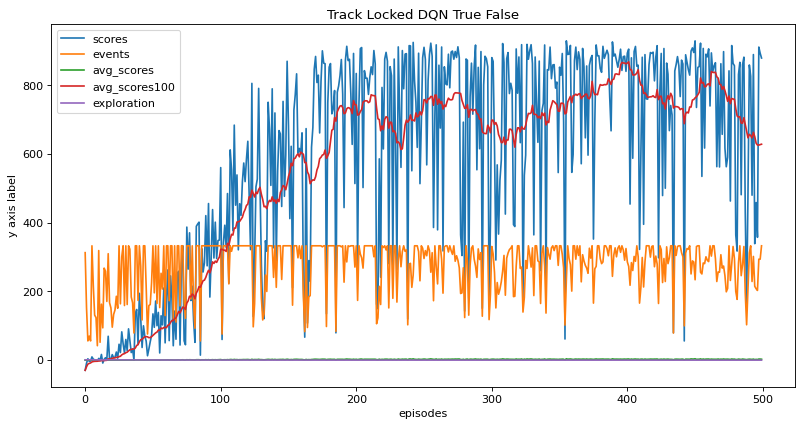

In [ ]:
figure(figsize=(12, 6), dpi=80)
plt.plot(episodes, scores)
plt.plot(episodes, events)
plt.plot(episodes, avg_scores)
plt.plot(episodes, avg_scores20)
plt.plot(episodes, exploration)
plt.xlabel('episodes')
plt.ylabel('y axis label')
 
plt.title('Track Locked DQN '+str(usedoubleDQN)+' '+str(useDueling))
plt.legend(['scores', 'events', 'avg_scores', 'avg_scores100','exploration'])
plt.show()

View Best Results

In [ ]:
createMovie(bestNet,'bestNet',UseRandomize,UseContinuousControl)




[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


 50%|█████     | 1/2 [00:00<00:00, 844.94it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


100%|██████████| 924/924 [00:09<00:00, 94.06it/s] 


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 



Validation Scenarios (5 with random track and 5 with random track and random environment)

In [ ]:
#TODO Add Validation code here, you can adapt the createMovie function to return the totalReward per episode
def createMovie(Network,Filename,UseRandomizer,UseContinuous):
  
    env1 = gym.make("CarRacing-v2", render_mode="rgb_array",domain_randomize=UseRandomizer, continuous=UseContinuous)
    envX = env1#wrappers.Monitor(env1, './videos/'+Filename,force=True)
    envX = RecordVideo(env1, video_folder='./videos/'+Filename,  episode_trigger = lambda episode_number: True)

    total_score=0.0 

    new_state, _ = envX.reset(options={"randomize": UseRandomizer})#,seed=6)


    envX.start_video_recorder()
    # ENV BUG, missing last_frame 
    envX.video_recorder.last_frame=new_state;

    
    stackedStateX=[np.rollaxis(new_state, 2, 0).copy() for i in range(FrameStack)];
    state =torch.from_numpy(np.reshape(np.array(stackedStateX),(FrameSize*FrameStack,96,96)) ).float().to(device)


    i=0
    Network.eval()
    resetStatus=0;   

    while True:
        envX.render()
        
        action = Network.policy(state);
        reward=0
        for x in range(ControlSteps):
            new_state, r, done, truncated, _  = envX.step(action_space[action.item()])
            reward+=r
            
            if(done):
                break
        total_score+=reward
        #if reward<0 and i>InitCounter:
        #    resetStatus=resetStatus+1;
        #else:
        #    resetStatus=0
        
        stackedStateX.pop(0)
        
 
        stackedStateX.append(np.rollaxis(new_state, 2, 0).copy())
        state=torch.from_numpy(np.reshape(np.array(stackedStateX),(FrameSize*FrameStack,96,96))).float().to(device)
        i=i+1;     
        if done or truncated: #or resetStatus>=ResetCounter: 
          break;

    envX.close()
    env1.close();
    Network.train()
    mp4list = glob.glob('./videos/'+Filename+'/*.mp4')
    print("Total_score",str(total_score))
    if len(mp4list) > 0:
        mp4 = mp4list[0]
        video = io.open(mp4, 'r+b').read()
        encoded = base64.b64encode(video)
        ipythondisplay.display(HTML(data='''<video alt="test" autoplay 
                loop controls style="height: 400px;">
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii'))))
    else: 
        print("Could not find video")

#print("Total_score",str(total_score))

In [ ]:
for i in range(5):
  print("Episode:",i) 
  createMovie(bestNet,'bestNet',UseRandomize,UseContinuousControl)

Episode: 0
[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


/content/gym/gym/wrappers/record_video.py:75: UserWarning: WARN: Overwriting existing videos at /content/gym/videos/bestNet folder (try specifying a different `video_folder` for the `RecordVideo` wrapper if this is not desired)
  logger.warn(
 50%|█████     | 1/2 [00:00<00:00, 775.00it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:07<00:00, 138.70it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 

Total_score 846.702654867238


Episode: 1
[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


 50%|█████     | 1/2 [00:00<00:00, 359.50it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:08<00:00, 123.58it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 

Total_score 886.4220735785751


Episode: 2
[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


 50%|█████     | 1/2 [00:00<00:00, 407.81it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


100%|██████████| 805/805 [00:06<00:00, 126.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 

Total_score 409.86393442621966


Episode: 3
[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


 50%|█████     | 1/2 [00:00<00:00, 273.64it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:08<00:00, 113.21it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 

Total_score 77.33623188406276


Episode: 4
[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


 50%|█████     | 1/2 [00:00<00:00, 409.76it/s]

[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 



[MoviePy] >>>> Building video /content/gym/videos/bestNet/rl-video-episode-0.mp4
[MoviePy] Writing video /content/gym/videos/bestNet/rl-video-episode-0.mp4


100%|██████████| 1001/1001 [00:08<00:00, 112.34it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: /content/gym/videos/bestNet/rl-video-episode-0.mp4 

Total_score 877.2436090225368
